# Data Preparation

In [1]:
# Import the necessary packages

# Native Python Packages



#Third Party Packages
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Create DataFrame
prv_train = pd.read_csv("Data/Perovskite_train.csv")

# Display
print("Total number of results:", len(prv_train))
display(prv_train.head()) # Using display instead of print leads to a neater output

Total number of results: 4165


,v(A),v(B),r(AXII)(Å),r(AVI)(Å),r(BVI)(Å),EN(A),EN(B),l(A-O)(Å),l(B-O)(Å),ΔENR,tG,τ,μ,Lowest distortion
0,0,0,0.52,0.52,0.93,2.18,2.54,2.214685,2.313698,-1.728214,0.582680,0.000000,0.664286,cubic
1,0,0,1.03,0.86,0.60,1.27,1.90,2.500930,0.000000,-1.768643,0.859135,0.000000,0.428571,cubic
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,4.936558,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,3.977376,0.442857,orthorhombic
4,0,0,0.57,0.57,0.71,2.20,1.30,2.300109,2.027412,-1.622357,0.660190,0.000000,0.507143,cubic


In [3]:
# Rename columns in prv_train DataFrame 
#(pep8 standard, a line of code should not exceed 79 characters
#so each renaming is it's own line)
prv_train = prv_train.rename(columns={'v(A)': 'vA'})
prv_train = prv_train.rename(columns={'v(B)': 'vB'})
prv_train = prv_train.rename(columns={'r(AXII)(Å)': 'r_A12'})
prv_train = prv_train.rename(columns={'r(AVI)(Å)': 'r_A6'})
prv_train = prv_train.rename(columns={'r(BVI)(Å)': 'r_B6'})
prv_train = prv_train.rename(columns={'EN(A)': 'EN_A'})
prv_train = prv_train.rename(columns={'EN(B)': 'EN_B'})
prv_train = prv_train.rename(columns={'l(A-O)(Å)': 'bond_len_AO'})
prv_train = prv_train.rename(columns={'l(B-O)(Å)': 'bond_len_BO'})
prv_train = prv_train.rename(columns={'ΔENR': 'EN_diff'})
prv_train = prv_train.rename(columns={'τ': 'tau'})
prv_train = prv_train.rename(columns={'μ': 'mu'})
prv_train = prv_train.rename(columns={'Lowest distortion': 'lowest_distortion'})

In [4]:
# Get summary
display(prv_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4165 entries, 0 to 4164
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   vA                 4165 non-null   int64  
 1   vB                 4165 non-null   int64  
 2   r_A12              4165 non-null   float64
 3   r_A6               4165 non-null   float64
 4   r_B6               4165 non-null   float64
 5   EN_A               4165 non-null   float64
 6   EN_B               4165 non-null   float64
 7   bond_len_AO        4165 non-null   float64
 8   bond_len_BO        4165 non-null   float64
 9   EN_diff            4165 non-null   float64
 10  tG                 4165 non-null   float64
 11  tau                4165 non-null   float64
 12  mu                 4165 non-null   float64
 13  lowest_distortion  4165 non-null   object 
dtypes: float64(11), int64(2), object(1)
memory usage: 455.7+ KB


None

List of Feature (or attributes, either work) Descriptions

- v(A) - Valence of A
- v(B) - Valence of B
- Radius A (r(A)) - ionic radius of A cation (A6)
- Radius A (r(A)) - ionic radius of A cation (a second one, A12)
- Radius B (r(B)) - ionic radius of B cation
- Electronegativity of A (EN(A)) - Average electronegativity value of A cation
- Electronegativity of B (EN(B)) - Average electronegativity value of B cation
- l(A-O) - Bond length of A-O pair
- l(B-O) - Bond length of B-O pair
- ΔENR - Electronegativity difference with radius
- tG - Goldschmidt tolerance factor
- τ New tolerance factor
- Μ - Octahedral factor


$$\tau = \frac{r_A + r_B}{\sqrt{2}(r_O) + l_{B-O} - l_{A-O}}$$
- r<sub>A</sub> is the ionic radius of the A-site cation.
- r<sub>B</sub> is the ionic radius of the B-site cation.
- r<sub>O</sub> is the radius of the oxygen ion.
- l<sub>A-O</sub> is the bond length of the A-O pair.
- l<sub>B-O</sub> is the bond length of the B-O pair.

\[
\begin{align*}
\tau &= \frac{r_A + r_B}{\sqrt{2}(r_O) + l_{B-O} - l_{A-O}}
\end{align*}
\]

\[
\begin{array}{c}
- r_A \text{ is the ionic radius of the A-site cation.} \\
- r_B \text{ is the ionic radius of the B-site cation.} \\
- r_O \text{ is the radius of the oxygen ion.} \\
- l_{A-O} \text{ is the bond length of the A-O pair.} \\
- l_{B-O} \text{ is the bond length of the B-O pair.}
\end{array}
\]


Mathematically, the Goldschmidt tolerance factor (tG) is given by:

$$ t_G = \frac{r_A + r_B}{2(r_O)} $$

Where:

- \( r_A \) is the ionic radius of the A-site cation.
- \( r_B \) is the ionic radius of the B-site cation.
- \( r_O \) is the radius of the oxygen ion.


side quest (because it is interesting) use latex to write formulas. use the data to derive formulas to prove ... treat the raw data as experimental data and verify that these relationships are true.

the formulas give context :) this is extra data that many times won't have. 

In [5]:
# Select columns with data type 'object'
string_col = prv_train.select_dtypes(include="object").columns

# Convert selected columns to the 'string' data type
prv_train[string_col] = prv_train[string_col].astype("string")


In [6]:
# Get summary
display(prv_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4165 entries, 0 to 4164
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   vA                 4165 non-null   int64  
 1   vB                 4165 non-null   int64  
 2   r_A12              4165 non-null   float64
 3   r_A6               4165 non-null   float64
 4   r_B6               4165 non-null   float64
 5   EN_A               4165 non-null   float64
 6   EN_B               4165 non-null   float64
 7   bond_len_AO        4165 non-null   float64
 8   bond_len_BO        4165 non-null   float64
 9   EN_diff            4165 non-null   float64
 10  tG                 4165 non-null   float64
 11  tau                4165 non-null   float64
 12  mu                 4165 non-null   float64
 13  lowest_distortion  4165 non-null   string 
dtypes: float64(11), int64(2), string(1)
memory usage: 455.7 KB


None

The object data has been converted to string. 

It appears there are indeed two measurements for the radius of the A cation, labeled as "r(AXII)(Å)" and "r(AVI)(Å)". This duplication could be due to different conventions or sources of data.

Here's a potential explanation for why there might be two A radius measurements:

Different Coordination Numbers (CN):

"r(AXII)(Å)" and "r(AVI)(Å)" might represent the ionic radius of the A cation under different coordination environments.
The notation "AXII" could indicate a coordination number of 12 (dodecahedral coordination), while "AVI" could indicate a coordination number of 6 (octahedral coordination).
Different Measurement Methods:

The two measurements might have been obtained using different experimental techniques or sources.
Each measurement could have its own precision, accuracy, and potential sources of error.
Data Integrity:

It's also possible that one of the measurements is incorrect or redundant due to data entry errors or inconsistencies.
Data cleaning and validation processes should be performed to ensure data integrity and consistency.
Domain-specific Context:

In certain domains or fields of study, multiple measurements for the same property might be common due to the complexity of the materials or phenomena being studied.
To determine the exact reason for the presence of two A radius measurements and decide how to handle them, it would be necessary to consult the dataset documentation or the source from which the data was obtained. Additionally, domain knowledge in materials science or chemistry could provide valuable insights into the significance of these measurements.

In [7]:
# Create a copy of the DataFrame to avoid altering the original
prv_train_num = prv_train.copy()

# Select columns with data type 'string'
string_col=prv_train_num.select_dtypes("string").columns.to_list()

In [8]:
# Extract column names of prv_train_num DataFrame and store them in num_col
num_col = prv_train_num.columns.to_list()

# Remove columns identified as string columns from num_col
#for col in string_col:
#    num_col.remove(col)

# Remove the column "Lowest distortion" from num_col
num_col.remove("lowest_distortion")
print(num_col)
# For my project this doesn't really remove anything, but
#if there were hundreds of columns then the strings would get 
# in the way of the data describe and so generally they would 
#be removed this way before describing the data.

['vA', 'vB', 'r_A12', 'r_A6', 'r_B6', 'EN_A', 'EN_B', 'bond_len_AO', 'bond_len_BO', 'EN_diff', 'tG', 'tau', 'mu']


In [9]:
# This line generates a summary statistics table for the DataFrame prv_train_num.
# The `.describe()` method calculates summary statistics for numerical columns by default.

# The `.T` at the end is a transpose operation, which swaps the rows and columns of the summary statistics table.
# This operation is performed to make the table more readable, with variables as rows and summary statistics as columns.
# It essentially transposes the DataFrame, swapping rows and columns.
# This is often done to have a better visual representation of the data, especially when there are many columns.

prv_train_num.describe().T

,count,mean,std,min,25%,50%,75%,max
vA,4165.0,0.882353,1.672111,-1.000000,-1.000000,0.000000,2.000000,5.000000
vB,4165.0,1.385114,2.161707,-1.000000,-1.000000,0.000000,3.000000,5.000000
r_A12,4165.0,1.005570,0.336940,0.270000,0.730000,0.980000,1.240000,1.880000
r_A6,4165.0,0.841789,0.240549,0.270000,0.670000,0.860000,0.960000,1.670000
r_B6,4165.0,0.801999,0.234891,0.270000,0.630000,0.760000,0.940000,1.670000
EN_A,4165.0,1.547309,0.447277,0.790000,1.200000,1.500000,1.910000,2.540000
EN_B,4165.0,1.599059,0.442961,0.790000,1.220000,1.600000,1.960000,2.540000
bond_len_AO,4165.0,2.323011,0.635699,0.000000,2.294004,2.422517,2.582926,3.300176
bond_len_BO,4165.0,2.017219,0.555599,0.000000,1.956808,2.075849,2.284156,3.009747
EN_diff,4165.0,-2.186093,0.636470,-5.411536,-2.570036,-2.084214,-1.734643,-0.601714


The zeros in Tau could be a problem. The max is also 305 with a mean of 1.3. Further investigation is needed. This column may need to be dropped.

EN(A) and (B) have the same values indicating that they are distributed the same. 

Some of the bond lengths are also showing zero and will need to be investigated.

If the valence(A) and (B) are both zero, in this dataset, it implies that both cations (A and B) are essentially neutral, meaning they have no charge. This scenario is highly unlikely and not physically meaningful in the context of perovskite compounds because A and B cations typically have non-zero valence states to contribute to the overall charge balance of the compound.

Therefore, in this dataset, the occurrence of both A and B having zero valence is likely an artifact or error rather than a meaningful data point. It's important to review the data and ensure its integrity, as such an occurrence may indicate issues with data collection or processing. These occurances may have to be dropped.

In [10]:
zero_counts = prv_train.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
vA                    859
vB                    859
r_A12                   0
r_A6                    0
r_B6                    0
EN_A                    0
EN_B                    0
bond_len_AO           254
bond_len_BO           243
EN_diff                 0
tG                      0
tau                  2177
mu                      0
lowest_distortion       0
dtype: int64


The \( \tau \) column, representing the New tolerance factor, is helpful for several reasons:

1. **Structural Stability Assessment**: The New tolerance factor (\( \tau \)) provides valuable insights into the structural stability of perovskite compounds. It considers not only the ionic radii of the A and B cations and the oxygen ion but also the bond lengths between these ions. By incorporating bond lengths, \( \tau \) offers a more comprehensive assessment of the compound's structural stability compared to the traditional Goldschmidt tolerance factor (\( t_G \)).

2. **Prediction of Crystal Structures**: \( \tau \) can be used as a predictive metric to estimate the likelihood of specific crystal structures in perovskite compounds. Different crystal structures, such as cubic, tetragonal, orthorhombic, and rhombohedral, may have characteristic ranges of \( \tau \) values. Therefore, analyzing \( \tau \) alongside experimental data can help researchers predict or identify the most probable crystal structure of a perovskite compound.

3. **Guidance for Materials Design**: Understanding the relationship between \( \tau \) and crystal structures can guide materials scientists in designing new perovskite materials with desired properties. By manipulating factors that influence \( \tau \), such as cation ionic radii and bond lengths, researchers can tailor the crystal structure of perovskite compounds to achieve specific functional properties, such as electronic, magnetic, or optical behavior.

4. **Comparative Analysis**: \( \tau \) allows for comparative analysis between different perovskite compounds or compositions. Researchers can use \( \tau \) to compare the structural stability of various perovskite materials and identify trends or correlations between \( \tau \) values and other material properties. This comparative analysis can inform the selection of perovskite compositions for specific applications or research objectives.

Overall, the \( \tau \) column provides valuable structural information that enhances our understanding of perovskite compounds, aids in crystal structure prediction, guides materials design efforts, and facilitates comparative analysis between different perovskite materials.

So it would be worth our time to investigate the effectiveness of the model both with and without Tau.


In [11]:
# Create a copy of the DataFrame to avoid altering the original
prv_train_tau = prv_train.copy()

# Drop rows with zero values
prv_train_tau = prv_train_tau[prv_train_tau['tau'] != 0]

# Display
print("Total number of results:", len(prv_train_tau))
display(prv_train_tau.head())

Total number of results: 1988


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,EN_diff,tG,tau,mu,lowest_distortion
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,4.936558,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,3.977376,0.442857,orthorhombic
6,1,5,0.92,0.80,0.62,1.78,2.36,2.392362,1.745600,-1.484143,0.812123,5.017992,0.442857,cubic
10,3,3,1.36,1.03,0.90,1.10,1.23,2.689119,2.258656,-2.931286,0.848528,3.536265,0.642857,orthorhombic
11,2,4,1.19,0.99,0.61,1.22,1.54,2.550861,1.927849,-2.040571,0.911148,4.133678,0.435714,orthorhombic


In [12]:
zero_counts = prv_train_tau.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
vA                   0
vB                   0
r_A12                0
r_A6                 0
r_B6                 0
EN_A                 0
EN_B                 0
bond_len_AO          0
bond_len_BO          0
EN_diff              0
tG                   0
tau                  0
mu                   0
lowest_distortion    0
dtype: int64


In [13]:
# Create a copy of the DataFrame to avoid altering the original
prv_train_no_tau = prv_train.copy()

# Drop tau column
prv_train_no_tau.drop(['tau'], axis=1, inplace=True)

# Display
print("Total number of results:", len(prv_train_no_tau))
display(prv_train_no_tau.head())

Total number of results: 4165


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,EN_diff,tG,mu,lowest_distortion
0,0,0,0.52,0.52,0.93,2.18,2.54,2.214685,2.313698,-1.728214,0.582680,0.664286,cubic
1,0,0,1.03,0.86,0.60,1.27,1.90,2.500930,0.000000,-1.768643,0.859135,0.428571,cubic
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,0.442857,orthorhombic
4,0,0,0.57,0.57,0.71,2.20,1.30,2.300109,2.027412,-1.622357,0.660190,0.507143,cubic


In [14]:
zero_counts = prv_train_no_tau.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
vA                   859
vB                   859
r_A12                  0
r_A6                   0
r_B6                   0
EN_A                   0
EN_B                   0
bond_len_AO          254
bond_len_BO          243
EN_diff                0
tG                     0
mu                     0
lowest_distortion      0
dtype: int64


should these zero values be left to skew the data to be incorrect or should they be dropped? vA and vB are crucial factors so zero values for those features would really not give any meaningful results. The dataset could be split here but then there would be multiple analyses on various datasets and not evaluations of various machine learning models. so these values will be dropped to limit the number of datasets and maximize the number of machine learning models ...

In [15]:
# Drop rows with zero values
prv_train_no_tau = prv_train_no_tau[prv_train_no_tau['vA'] != 0]

# Display
print("Total number of results:", len(prv_train_no_tau))
display(prv_train_no_tau.head())

Total number of results: 3306


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,EN_diff,tG,mu,lowest_distortion
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,0.442857,orthorhombic
6,1,5,0.92,0.80,0.62,1.78,2.36,2.392362,1.745600,-1.484143,0.812123,0.442857,cubic
10,3,3,1.36,1.03,0.90,1.10,1.23,2.689119,2.258656,-2.931286,0.848528,0.642857,orthorhombic
11,2,4,1.19,0.99,0.61,1.22,1.54,2.550861,1.927849,-2.040571,0.911148,0.435714,orthorhombic


In [16]:
zero_counts = prv_train_no_tau.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
vA                   0
vB                   0
r_A12                0
r_A6                 0
r_B6                 0
EN_A                 0
EN_B                 0
bond_len_AO          0
bond_len_BO          0
EN_diff              0
tG                   0
mu                   0
lowest_distortion    0
dtype: int64


where vA is zero, it appears that vB and also bond_len_AO and bond_len_BO are all also zero. so only the zeros from vA needed to be dropped.

##Correlation Matrix
Lighter shades represents positive correlation
Darker shades represents negative correlation

In [17]:
px.imshow(prv_train_tau.corr(),title="Correlation Plot of Perovskite Data with Tau")

Some things to note: 

Strong Correlations:

Some variables exhibit strong correlations. For instance, there is a perfect negative correlation (-1) between vA and vB, indicating that they are inversely related. Similarly, r_A12 and r_A6, which likely represent different aspects of the same quantity, show a strong positive correlation (0.917346), suggesting they move in the same direction.
Variables such as bond_len_AO and bond_len_BO also show strong positive correlations (0.923351), implying a strong relationship between the bond lengths of A-O and B-O pairs.
Moderate Correlations:

There are moderate correlations between certain variables, such as tG and bond_len_AO (0.785924) or tG and r_A12 (0.863578). These correlations suggest some degree of relationship between the variables but may not be as strong as the highly correlated ones.
Weak Correlations:

Some variables exhibit weak correlations or no significant correlation at all. For example, the correlation between EN_A and EN_B is relatively low (-0.034935), indicating a weak relationship between the electronegativities of A and B cations.
Interpretation Considerations:

Correlation does not imply causation. While correlated variables may move together, it does not necessarily mean that changes in one variable cause changes in the other.
It's essential to consider domain knowledge when interpreting correlations. Understanding the physical or chemical relationship between variables can provide insights into why certain correlations exist and their implications.
Directionality:

The sign of the correlation coefficient indicates the direction of the relationship between variables. A positive correlation suggests that as one variable increases, the other tends to increase as well, while a negative correlation indicates that as one variable increases, the other tends to decrease.
Overall, this correlation matrix provides valuable information about the relationships between different features in the dataset, which can aid in understanding the underlying structure and dependencies within the data.

In [18]:
px.imshow(prv_train_no_tau.corr(),title="Correlation Plot of Perovskite Data without Tau")

Note:
- the vA and vB relationship is positive in one matrix and negatively correlated in the other matrix. So the data encompasses both a positive and negative relationship. Could possibly mean that different data sets were combined. 

- 

In this correlation matrix, several noteworthy observations can be made:

Strong Positive Correlations:

Variables such as vA and vB (0.813366), r_A12 and r_A6 (0.935433), bond_len_AO and bond_len_BO (0.938676), and bond_len_BO and EN_diff (0.907513) exhibit strong positive correlations. These correlations suggest that changes in one variable tend to be associated with similar changes in the other variable, moving in the same direction.
Strong Negative Correlations:

There are also strong negative correlations observed, such as between r_B6 and tG (-0.842273) or between EN_diff and EN_A (-0.842273). These negative correlations suggest an inverse relationship between the variables, where increases in one variable are associated with decreases in the other.
Moderate Correlations:

Moderate correlations are present between various pairs of variables, such as vA and tG (0.215130), vB and tG (0.342345), bond_len_AO and r_A12 (0.905104), or EN_B and EN_diff (0.674963). These moderate correlations indicate a discernible but not excessively strong relationship between the variables.
Symmetry:

The correlation matrix is symmetric across the diagonal, which is expected since the correlation between variable X and variable Y is the same as the correlation between variable Y and variable X.
Diagonal Elements:

The diagonal elements of the matrix (where variables are compared with themselves) have a correlation coefficient of 1. This is because a variable is perfectly correlated with itself.
Overall, this correlation matrix provides valuable insights into the relationships between different variables in the dataset, which can aid in understanding the underlying patterns and dependencies within the data.

Comparing and contrasting the two correlation matrices:

Strength of Correlations:

Matrix 1 (with tau): Contains several strong correlations, both positive and negative, with correlation coefficients close to 1 or -1.
Matrix 2 (without tau): Exhibits fewer strong correlations compared to Matrix 1, with more moderate correlations observed.

Variable Relationships:

Matrix 1 (with tau): Shows strong relationships between certain variables, such as vA and vB, or bond_len_AO and bond_len_BO.
Matrix 2 (without tau): Demonstrates weaker relationships between variables, with fewer instances of strong correlations.

Directionality:

Both matrices display positive and negative correlations, indicating both direct and inverse relationships between variables.
However, Matrix 1 tends to have stronger correlations in both positive and negative directions compared to Matrix 2.

Domain-specific Insights:

Matrix 1 (with tau): May suggest tighter dependencies between variables, potentially indicating stronger physical or chemical relationships within the dataset.
Matrix 2 (without tau): With weaker correlations overall, might suggest a more complex or diverse dataset with less straightforward relationships between variables.

Interpretation:

Matrix 1 (with tau): May be indicative of a dataset where certain variables have more direct influences on each other, leading to stronger correlations.
Matrix 2 (without tau): May represent a dataset with more diverse or less deterministic relationships between variables, leading to weaker correlations overall.

Overall, while both matrices provide insights into the relationships between variables, Matrix 1 suggests a dataset with stronger and more direct dependencies between variables, whereas Matrix 2 indicates a dataset with weaker and potentially more diverse relationships. The choice of which matrix to use for analysis would depend on the specific research questions and objectives.
This could be due to to the increased number of data points in Matrix 1 and the ability to highlight strong linear relationships.

[]

<Figure size 1080x720 with 0 Axes>

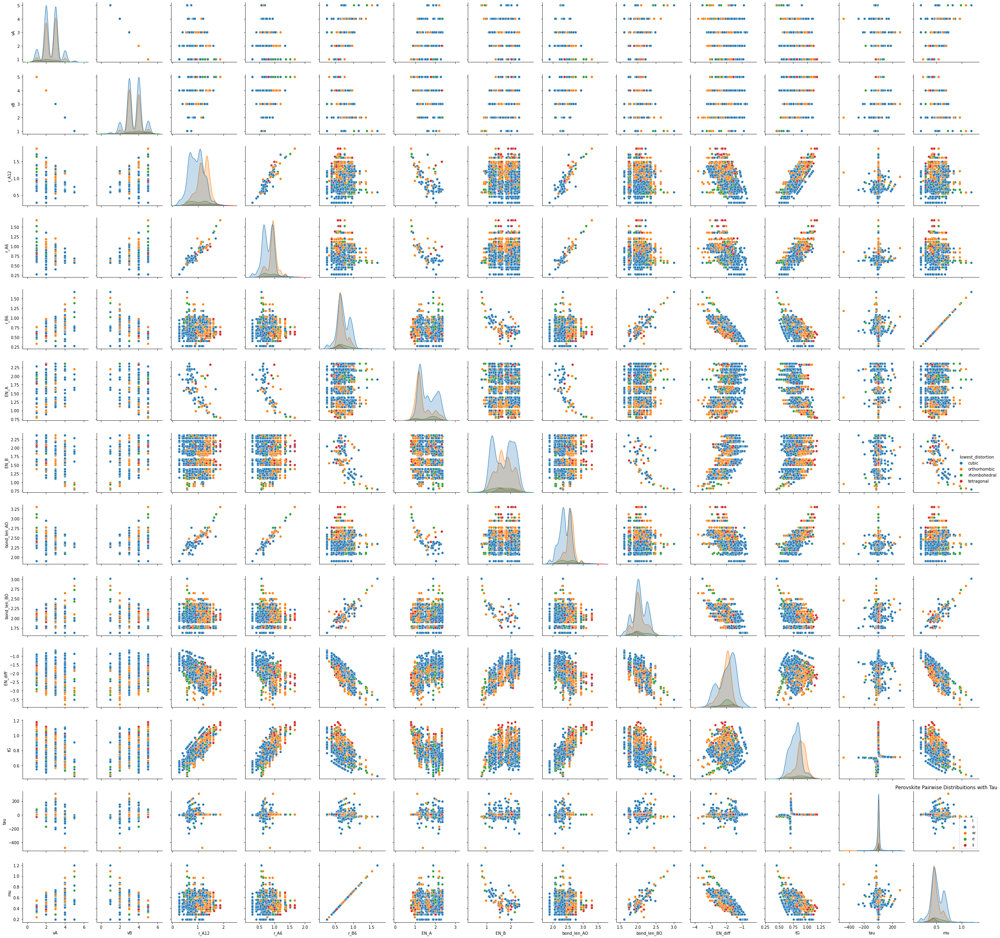

In [19]:
plt.figure(figsize=(15,10))
sns.pairplot(prv_train_tau,hue="lowest_distortion")
plt.title("Perovskite Pairwise Distribuitions with Tau")
plt.legend("lowest_distortion")
plt.tight_layout()
plt.plot()

[]

<Figure size 1080x720 with 0 Axes>

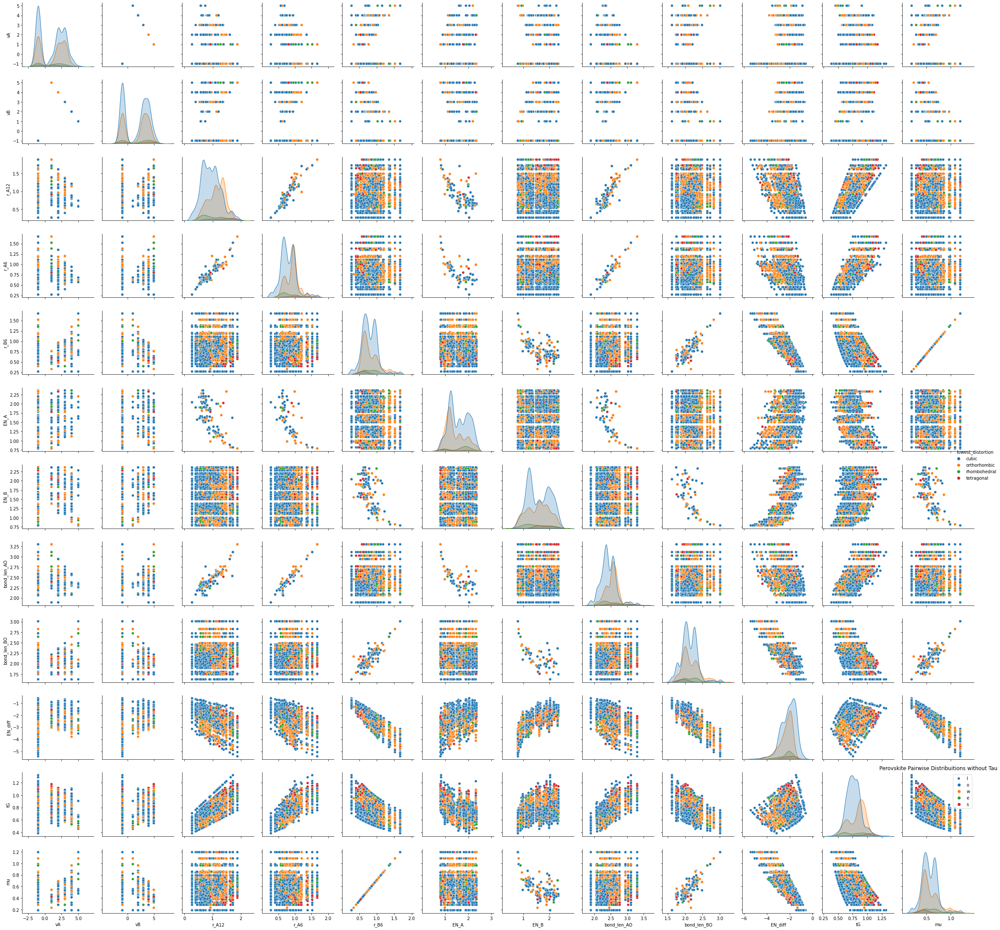

In [20]:
plt.figure(figsize=(15,10))
sns.pairplot(prv_train_no_tau,hue="lowest_distortion")
plt.title("Perovskite Pairwise Distribuitions without Tau")
plt.legend("lowest_distortion")
plt.tight_layout()
plt.plot()

Now to check the linearity of the variables it is a good practice to plot distribution graph and look for skewness of features. Kernel density estimate (kde) is a quite useful tool for plotting the shape of a distribution.

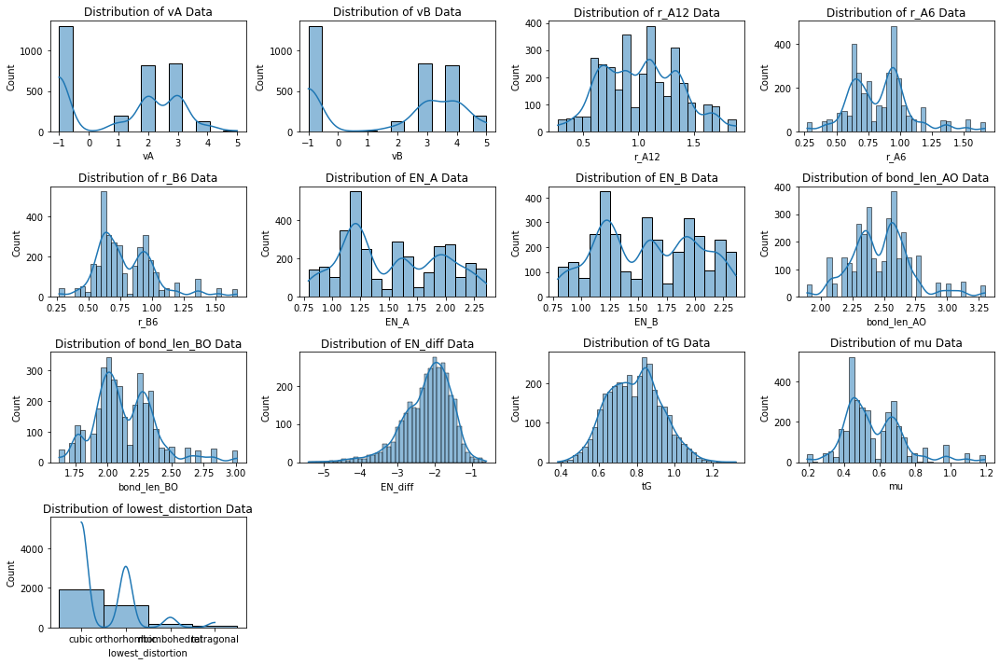

In [21]:
# Set up the figure size for the plot
plt.figure(figsize=(15,10))

# Iterate over each column in the dataframe
for i, col in enumerate(prv_train_no_tau.columns, 1):
    # Create subplots in a 4x4 grid
    plt.subplot(4, 4, i)
    
    # Set title for each subplot indicating the distribution of data for the corresponding column
    plt.title(f"Distribution of {col} Data")
    
    # Plot the histogram with kernel density estimation using seaborn's histplot function
    sns.histplot(prv_train_no_tau[col], kde=True)
    
    # Adjust subplot layout
    plt.tight_layout()
    
    # Ensure the plot is shown
    plt.plot()


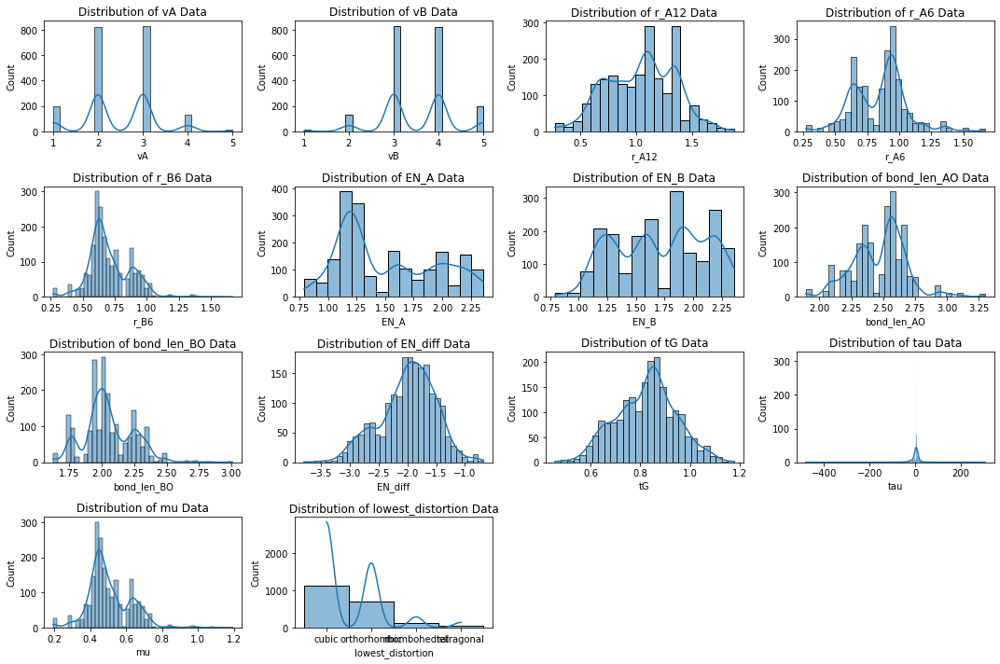

In [22]:
# Set up the figure size for the plot
plt.figure(figsize=(15,10))

# Iterate over each column in the dataframe
for i, col in enumerate(prv_train_tau.columns, 1):
    # Create subplots in a 4x4 grid
    plt.subplot(4, 4, i)
    
    # Set title for each subplot indicating the distribution of data for the corresponding column
    plt.title(f"Distribution of {col} Data")
    
    # Plot the histogram with kernel density estimation using seaborn's histplot function
    sns.histplot(prv_train_tau[col], kde=True)
    
    # Adjust subplot layout
    plt.tight_layout()
    
    # Ensure the plot is shown
    plt.plot()


In [23]:
# How many values in vA and vB are -1?
#len(prv_train_no_tau[(prv_train_no_tau['vA'] == -1)])

# Accessing -1 values 
#print('Total number of results:', len(prv_train_no_tau[prv_train_no_tau.duplicated(['title'], keep=False)]))
#prv_train_no_tau[prv_train_no_tau.duplicated(['vA'], keep=False)].head()

prv_train_no_tau.loc[prv_train_no_tau['vA'] == -1]


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,EN_diff,tG,mu,lowest_distortion
20,-1,-1,1.24,0.96,0.99,1.17,1.22,2.611965,2.255581,-3.002036,0.781072,0.707143,cubic
21,-1,-1,1.70,1.20,0.80,1.62,1.78,2.531967,2.147681,-2.510714,0.996378,0.571429,orthorhombic
23,-1,-1,0.27,0.27,0.27,2.04,2.04,1.891523,1.624662,-0.601714,0.707107,0.192857,cubic
24,-1,-1,0.63,0.63,0.90,2.20,2.02,2.311295,2.215655,-1.823786,0.624099,0.642857,cubic
30,-1,-1,0.90,0.63,1.52,1.88,0.82,2.233563,2.825997,-3.556429,0.556968,1.085714,rhombohedral
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4137,-1,-1,0.68,0.68,0.90,2.05,2.02,2.361079,2.215655,-1.897357,0.639470,0.642857,cubic
4142,-1,-1,0.45,0.45,1.11,1.57,2.00,2.178342,2.323655,-2.336464,0.521174,0.792857,cubic
4143,-1,-1,0.87,0.75,0.62,1.36,1.55,2.417029,2.169994,-1.809536,0.794620,0.442857,cubic
4146,-1,-1,1.03,0.86,0.77,1.27,2.10,2.500930,2.115492,-2.035679,0.791829,0.550000,cubic


this might be two data sets combined. One data set has valence electrons reported for each entry and a tau calculation. Another data set that doesn't contain valence electrons or a calculated tau value. 

References:
1. https://www.kaggle.com/code/durgancegaur/a-guide-to-any-classification-problem#Exploratory-Data-Analysis
2. https://www.kaggle.com/datasets/meetnagadia/crystal-structure-dataset?resource=download
3. https://www.sciencedirect.com/topics/engineering/perovskite-structure#:~:text=As%20shown%20in%20Figure%203,a%20total%20charge%20of%20%2B6.
4. https://en.wikipedia.org/wiki/Perovskite_(structure)
5. 
